In [2]:
from astropy import units as u
from astropy.constants import G, c
from IPython.display import display, clear_output, HTML
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.animation as animation
import spacehub_calc
from spacehub_calc import Theorize
import math
import seaborn as sns


In [3]:
Theorize.decay_time_PN2p5(0.05, 150, 150, 0.7)

<Quantity 10905.64404785 yr>

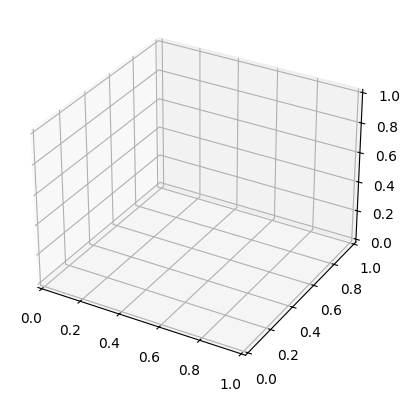

In [4]:
data = spacehub_calc.load_spacehub_data("simulation_results/Scattering_demo_1+1.txt")
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
df_0 = data[data["id"]==0]
df_1 = data[data["id"]==1]

In [5]:
p0 = [list(df_0["px"]), list(df_0["py"]), list(df_0["pz"])]
p1 = [list(df_1["px"]), list(df_1["py"]), list(df_1["pz"])]

#### Todo:
- Put the target at the origin instead of the center of mass: use X, Y, Z = distance(p0, p1)
- plot the final state output from "simulation_results/scattering_demo_finalstate.txt" to see if it matches up with the trajectory

In [10]:
global scatter_0, scatter_1
ax.set_zlim(-100, 100)
ax.set_xlim(-100, 100)
ax.set_ylim(-100, 100)
scatter_0 = ax.scatter3D(p0[0][0], p0[1][0], p0[2][0], c="maroon")
scatter_1 = ax.scatter3D(p1[0][0], p1[1][0], p1[2][0], c="maroon")
#scatter_1 = ax.scatter3D(p1[0][0], p1[1][0], p1[2][0], c="blue")
#traj_0 = ax.plot(p0[0][0], p0[1][0], p0[2][0], c="red")[0]
def update(frame_num):
            # Erase lines after set time
            window_size = 1
            window_start = frame_num-window_size if (frame_num > window_size) else 0
            #particle 0
            x0 = p0[0][window_start:frame_num]
            y0 = p0[1][window_start:frame_num]
            z0 = p0[2][window_start:frame_num]
            
            #particle 1
            x1 = p1[0][window_start:frame_num]
            y1 = p1[1][window_start:frame_num]
            z1 = p1[2][window_start:frame_num]

            # Update scatter
            global scatter_0, scatter_1  # Need global to reassign
            scatter_0.remove()
            scatter_0 = ax.scatter3D(x0, y0, z0, c="blue")

            scatter_1.remove()
            scatter_1 = ax.scatter3D(x1, y1, z1, c="red")
            # update the line plot:
            #traj_0.set_data([p0[0][:frame_num], p0[1][:frame_num]])
            #traj_0.set_3d_properties(p0[2][:frame_num])

            #traj.set_zdata(z[:frame])
            return (scatter_0, scatter_1)

ani = animation.FuncAnimation(fig=fig, func=update, frames=200, interval=100)
HTML(ani.to_jshtml())